In [2]:
!pip install -q ultralytics "opencv-python-headless>=4.9.0.80" && apt-get -qq update && apt-get -qq install -y ffmpeg


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.0/182.0 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 114.4 MB/s eta 0:00:00
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [4]:
import ultralytics
print(ultralytics.__version__)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
8.4.14


In [9]:
RAW_VIDEO = "cow_video.mp4"         # raw file
OUTPUT_VIDEO = "cow_tracked_output.mp4"   # final annotated output
BOTSORT_YAML = "my_botsort.yaml"         # custom tracker config
MODEL_NAME = "yolo11m.pt"                # model to use (YOLO-11m)

Cow class ID: 19
Found 3 images

Processing 3.png
Cows detected: 8


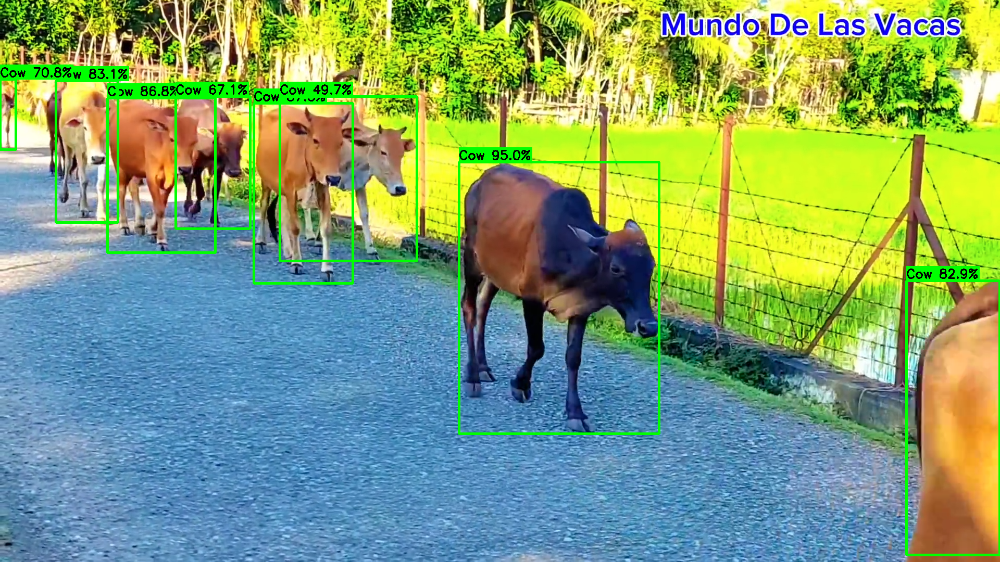


Processing 2.png
Cows detected: 3


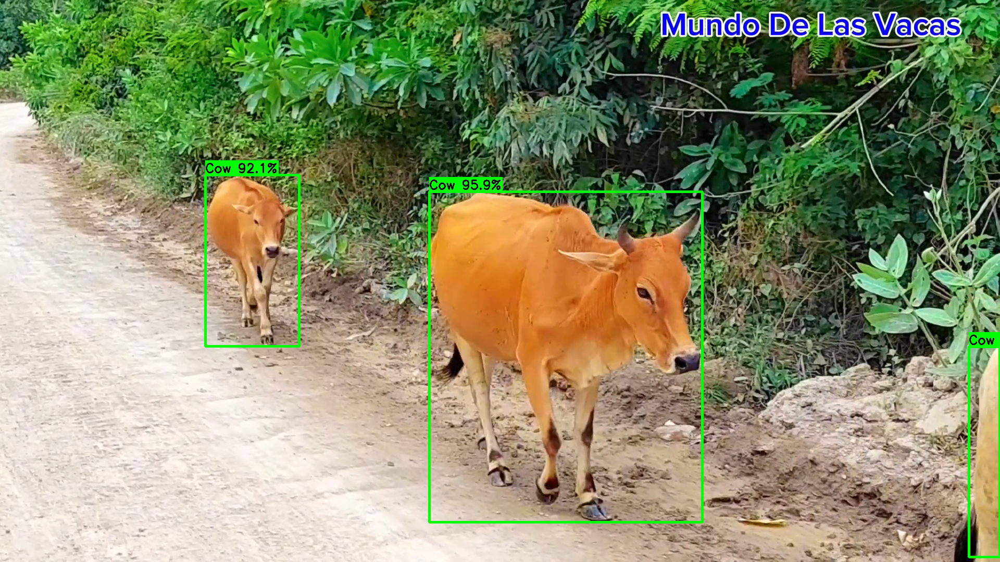


Processing 1.png
Cows detected: 8


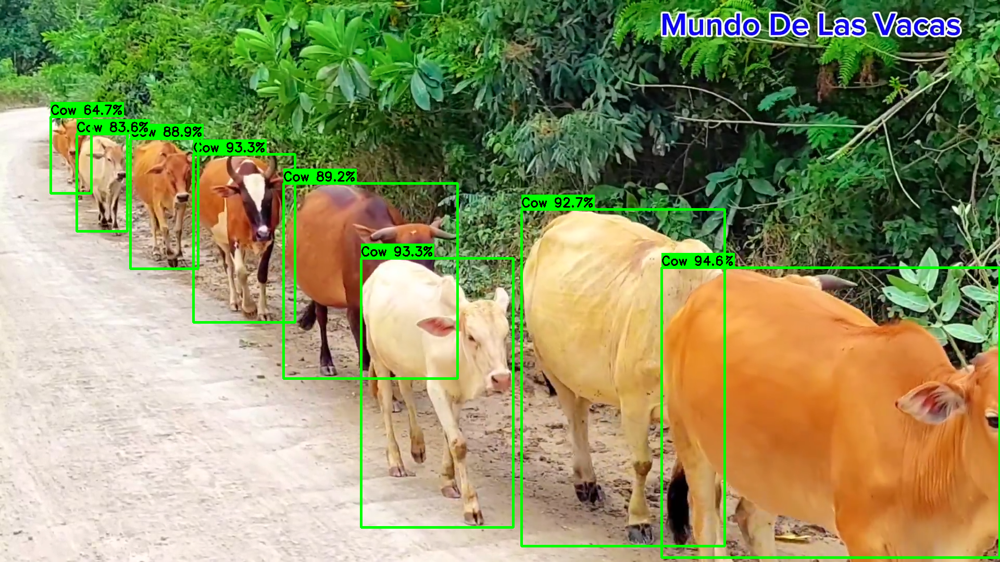


✅ Done. Annotated images saved in: output_images


In [6]:
import os
import cv2
from ultralytics import YOLO
from IPython.display import display, Image
from pathlib import Path

# -------- SETTINGS --------
OUTPUT_DIR = "output_images"
MODEL_NAME = "yolo11m.pt"
CONF = 0.3
IOU = 0.5
# --------------------------

os.makedirs(OUTPUT_DIR, exist_ok=True)

# Load model
model = YOLO(MODEL_NAME)

# Find cow class index
cow_idx = None
for k, v in model.names.items():
    if v.lower() == "cow":
        cow_idx = k
        break

if cow_idx is None:
    raise ValueError("Cow class not found in model")

print("Cow class ID:", cow_idx)

# Get all image files in current directory
image_paths = list(Path(".").glob("*.jpg")) + \
              list(Path(".").glob("*.png")) + \
              list(Path(".").glob("*.jpeg"))

print(f"Found {len(image_paths)} images")

for img_path in image_paths:

    print(f"\nProcessing {img_path.name}")

    results = model(
        source=str(img_path),
        conf=CONF,
        iou=IOU,
        classes=[cow_idx],
        verbose=False
    )

    img = cv2.imread(str(img_path))

    if results[0].boxes is not None and len(results[0].boxes) > 0:

        boxes = results[0].boxes.xyxy.cpu().numpy()
        scores = results[0].boxes.conf.cpu().numpy()

        print("Cows detected:", len(boxes))

        for box, score in zip(boxes, scores):

            x1, y1, x2, y2 = map(int, box)

            # Draw bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 3)

            # Label with confidence (percentage format)
            label = f"Cow {score*100:.1f}%"

            (tw, th), _ = cv2.getTextSize(label,
                                          cv2.FONT_HERSHEY_SIMPLEX,
                                          0.8, 2)

            cv2.rectangle(img,
                          (x1, y1 - th - 10),
                          (x1 + tw, y1),
                          (0,255,0), -1)

            cv2.putText(img,
                        label,
                        (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        (0,0,0),
                        2)

    else:
        print("No cows detected")

    output_path = os.path.join(OUTPUT_DIR, img_path.name)
    cv2.imwrite(output_path, img)

    display(Image(output_path))

print("\n✅ Done. Annotated images saved in:", OUTPUT_DIR)


In [7]:
# Create a custom BoTSORT config to focus on tracking performance
botsort_content = """

tracker_type: botsort

# Required by Ultralytics
model: auto
gmc_method: none

# Detection thresholds
track_high_thresh: 0.5
track_low_thresh: 0.1
new_track_thresh: 0.6

# Association
match_thresh: 0.8
fuse_score: true

# Track lifecycle
track_buffer: 30
max_time_lost: 30

# Motion model
kalman_filter: true

# ReID (DISABLED for stability)
with_reid: false
proximity_thresh: 0.5
appearance_thresh: 0.25

# Filtering
min_box_area: 100
aspect_ratio_thresh: 10.0

# Debug
verbose: false

"""

with open(BOTSORT_YAML, 'w') as f:
    f.write(botsort_content.strip())

print(f"Config saved to {BOTSORT_YAML}")

Config saved to my_botsort.yaml


In [10]:
from ultralytics import YOLO

# Load model
model = YOLO(MODEL_NAME)

# Find cow class index
cow_idx = None
for k, v in model.names.items():
    if v.lower() == "cow":
        cow_idx = k
        break

if cow_idx is None:
    raise ValueError("Cow class not found in model")

# Run tracking
results = model.track(
    source=RAW_VIDEO,
    conf=0.4,
    iou=0.5,
    classes=[cow_idx],          # IMPORTANT
    tracker=BOTSORT_YAML,
    show=False,
    save=True,
    persist=True,
    name="cow_tracking_run"
)

print("Tracking complete.")



WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/900) /content/cow_video.mp4: 384x640 5 cows, 25.3ms
video 1/1 (frame 2/900) /content/cow_video.mp4: 384x640 5 cows, 25.7ms
video 1/1 (frame 3/900) /content/cow_video.mp4: 384x640 5 cows, 32.8ms
video 1/1 (frame 4/900) /content/cow_video.mp4: 384x640 5 cows, 30.7ms
video 1/1 (frame 5/900) /content/cow_video.mp4: 384x640 6 cows, 29.5ms
video 1/1 (frame 6/900) /content/cow_video.mp4: 384x640 6 cows, 30.9ms
video 1/1 (frame 7/900) /content